<a href="https://colab.research.google.com/github/warthon-190399/Inside_INPE/blob/main/INSIDE_INPE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Inside Inpe

## 1.- Import libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
!pip install pydeck
!pip install h3
import pydeck as pdk
from shapely.geometry import Point
import scipy as sp
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import json
import h3
import os
import warnings
warnings.filterwarnings("ignore")

In [5]:
crimpob = pd.read_csv('crimenes_2021.csv',
                index_col='ID'
                )
crimpob

,OFICINA_REGIONAL,ESTABLECIMIENTO_PENITENCIARIO,DEPARTAMENTO,PROVINCIA,DISTRITO,LATITUD,LONGITUD,NUCLEO_URBANO,TIPO_NUCLEO,LOCALIZACION_TB,...,SEXO_HOMBRE_KPI,SEXO_MUJER_KPI,NUMERO_DE_INGRESOS,GRUPOS_DE_INGRESOS,PRIMARIOS_KPI,DOS_INGRESOS_KPI,TRES_INGRESOS_KPI,EDAD,RANGO_DE_EDAD,GRUPO_ETAREO
ID,,,,,,,,,,,,,,,,,,,,,
1,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE MIRAFLORES,-12.162536,-76.959604,AA.HH. ANTONIO DE PADUA,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,24,18 - 24,18 - 29
2,LIMA - LIMA,CHINCHA,ICA,CHINCHA,CHINCHA ALTA,-13.398056,-76.145652,AA.HH. MIGUEL GRAU,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,24,18 - 24,18 - 29
3,LIMA - LIMA,CHINCHA,ICA,CHINCHA,CHINCHA ALTA,-13.394136,-76.129510,UPIS EL TREBOL,OTROS,PULMONAR,...,1,0,3,Tres a más ingresos,0,0,1,28,25 - 29,18 - 29
4,LIMA - LIMA,CHINCHA,ICA,CHINCHA,SUNAMPE,-13.431362,-76.138779,CENTRO POBLADO SAN MARTIN,CENTRO POBLADO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,27,25 - 29,18 - 29
5,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.979465,-76.989448,AA.HH. EL PARAISO HUÁSCAR,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,22,18 - 24,18 - 29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,LIMA - LIMA,CALLAO,LIMA,LIMA,LIMA,-12.044300,-77.097900,URB. CONQUISTADORES,URBANIZACIÓN,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,26,25 - 29,18 - 29
3096,LIMA - LIMA,CALLAO,CALLAO,CALLAO,CALLAO,-12.043800,-77.102700,URB. CALLAO,URBANIZACIÓN,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,30,30 - 34,30 - 59
3097,LIMA - LIMA,CALLAO,CALLAO,CALLAO,CALLAO,-12.018289,-77.136494,CORONEL FRANCISCO BOLOGNESI,OTROS,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,54,50 - 54,30 - 59


## 2.- Exploratory Data Analysis

###2.1.- Data Cleaning

In [6]:
crimpob_lc = crimpob[(crimpob['DEPARTAMENTO'].isin(['LIMA', 'CALLAO'])) &
                     ((crimpob['PROVINCIA'] == 'LIMA') |
                      (crimpob['DEPARTAMENTO'] == 'CALLAO'))]
crimpob_lc

,OFICINA_REGIONAL,ESTABLECIMIENTO_PENITENCIARIO,DEPARTAMENTO,PROVINCIA,DISTRITO,LATITUD,LONGITUD,NUCLEO_URBANO,TIPO_NUCLEO,LOCALIZACION_TB,...,SEXO_HOMBRE_KPI,SEXO_MUJER_KPI,NUMERO_DE_INGRESOS,GRUPOS_DE_INGRESOS,PRIMARIOS_KPI,DOS_INGRESOS_KPI,TRES_INGRESOS_KPI,EDAD,RANGO_DE_EDAD,GRUPO_ETAREO
ID,,,,,,,,,,,,,,,,,,,,,
1,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE MIRAFLORES,-12.162536,-76.959604,AA.HH. ANTONIO DE PADUA,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,24,18 - 24,18 - 29
5,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.979465,-76.989448,AA.HH. EL PARAISO HUÁSCAR,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,22,18 - 24,18 - 29
7,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.939513,-76.977647,AA.HH. MOTUPE,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,20,18 - 24,18 - 29
8,LIMA - LIMA,CHINCHA,LIMA,LIMA,VILLA MARIA DEL TRIUNFO,-12.142340,-76.941695,AA.HH. VALLECITO ALTO,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,28,25 - 29,18 - 29
9,LIMA - LIMA,CHINCHA,LIMA,LIMA,VILLA MARIA DEL TRIUNFO,-12.157749,-76.947567,AA.HH. ARENAL ALTO,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,25,25 - 29,18 - 29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,LIMA - LIMA,CALLAO,LIMA,LIMA,LIMA,-12.044300,-77.097900,URB. CONQUISTADORES,URBANIZACIÓN,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,26,25 - 29,18 - 29
3096,LIMA - LIMA,CALLAO,CALLAO,CALLAO,CALLAO,-12.043800,-77.102700,URB. CALLAO,URBANIZACIÓN,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,30,30 - 34,30 - 59
3097,LIMA - LIMA,CALLAO,CALLAO,CALLAO,CALLAO,-12.018289,-77.136494,CORONEL FRANCISCO BOLOGNESI,OTROS,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,54,50 - 54,30 - 59


In [7]:
crimpob_lc.dropna()

,OFICINA_REGIONAL,ESTABLECIMIENTO_PENITENCIARIO,DEPARTAMENTO,PROVINCIA,DISTRITO,LATITUD,LONGITUD,NUCLEO_URBANO,TIPO_NUCLEO,LOCALIZACION_TB,...,SEXO_HOMBRE_KPI,SEXO_MUJER_KPI,NUMERO_DE_INGRESOS,GRUPOS_DE_INGRESOS,PRIMARIOS_KPI,DOS_INGRESOS_KPI,TRES_INGRESOS_KPI,EDAD,RANGO_DE_EDAD,GRUPO_ETAREO
ID,,,,,,,,,,,,,,,,,,,,,
1,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE MIRAFLORES,-12.162536,-76.959604,AA.HH. ANTONIO DE PADUA,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,24,18 - 24,18 - 29
5,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.979465,-76.989448,AA.HH. EL PARAISO HUÁSCAR,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,22,18 - 24,18 - 29
7,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.939513,-76.977647,AA.HH. MOTUPE,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,20,18 - 24,18 - 29
8,LIMA - LIMA,CHINCHA,LIMA,LIMA,VILLA MARIA DEL TRIUNFO,-12.142340,-76.941695,AA.HH. VALLECITO ALTO,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,28,25 - 29,18 - 29
9,LIMA - LIMA,CHINCHA,LIMA,LIMA,VILLA MARIA DEL TRIUNFO,-12.157749,-76.947567,AA.HH. ARENAL ALTO,ASENTAMIENTO HUMANO,PULMONAR,...,1,0,1,Ingresa al penal por primera vez,1,0,0,25,25 - 29,18 - 29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,LIMA - LIMA,CALLAO,LIMA,LIMA,LIMA,-12.044300,-77.097900,URB. CONQUISTADORES,URBANIZACIÓN,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,26,25 - 29,18 - 29
3096,LIMA - LIMA,CALLAO,CALLAO,CALLAO,CALLAO,-12.043800,-77.102700,URB. CALLAO,URBANIZACIÓN,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,30,30 - 34,30 - 59
3097,LIMA - LIMA,CALLAO,CALLAO,CALLAO,CALLAO,-12.018289,-77.136494,CORONEL FRANCISCO BOLOGNESI,OTROS,PULMONAR,...,1,0,2,Dos ingresos,0,1,0,54,50 - 54,30 - 59


In [8]:
crimpob_lc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1818 entries, 1 to 3099
Data columns (total 48 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   OFICINA_REGIONAL                                1818 non-null   object 
 1   ESTABLECIMIENTO_PENITENCIARIO                   1818 non-null   object 
 2   DEPARTAMENTO                                    1818 non-null   object 
 3   PROVINCIA                                       1818 non-null   object 
 4   DISTRITO                                        1818 non-null   object 
 5   LATITUD                                         1818 non-null   float64
 6   LONGITUD                                        1818 non-null   float64
 7   NUCLEO_URBANO                                   1817 non-null   object 
 8   TIPO_NUCLEO                                     1818 non-null   object 
 9   LOCALIZACION_TB                          

###2.2.- Data Visualization

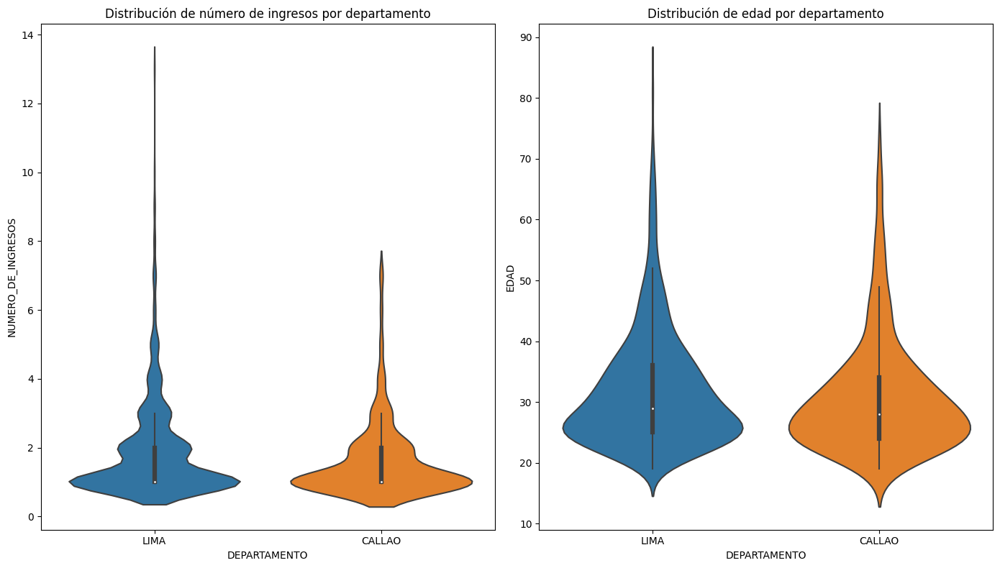

In [9]:
plt.style.use('fast')
plt.figure(figsize=(14, 8))
plt.subplot(1, 2, 1)
sns.violinplot(data=crimpob_lc,
               x='DEPARTAMENTO',
               y='NUMERO_DE_INGRESOS',
               )
plt.title('Distribución de número de ingresos por departamento')

plt.subplot(1, 2, 2)
sns.violinplot(data=crimpob_lc,
               x='DEPARTAMENTO',
               y='EDAD'
              )
plt.title('Distribución de edad por departamento')

plt.tight_layout()
plt.show()

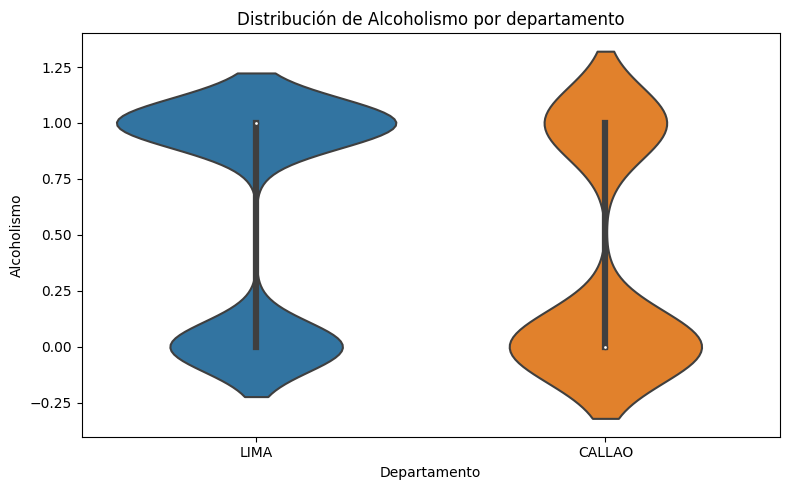

In [10]:
plt.figure(figsize=(8, 5))
sns.violinplot(x='DEPARTAMENTO', y='ALCOHOLISMO_KPI', data=crimpob_lc)
plt.title('Distribución de Alcoholismo por departamento')
plt.xlabel('Departamento')
plt.ylabel('Alcoholismo')
plt.tight_layout()
plt.show()

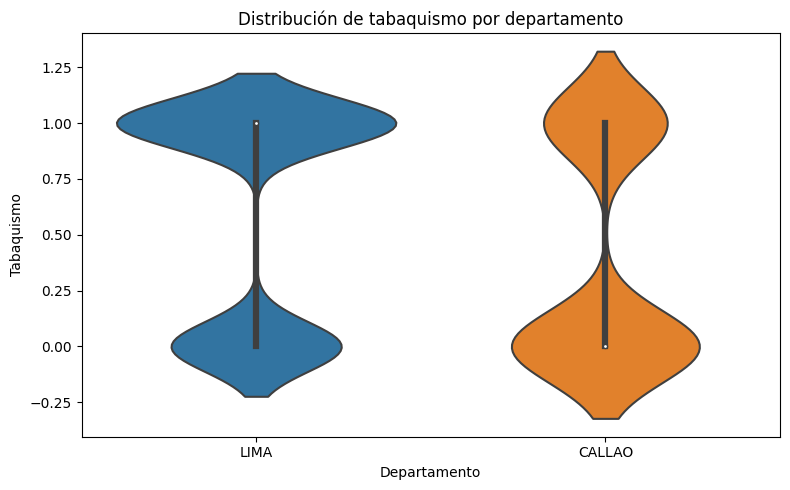

In [11]:
plt.figure(figsize=(8, 5))
sns.violinplot(x='DEPARTAMENTO', y='TABAQUISMO_KPI', data=crimpob_lc)
plt.title('Distribución de tabaquismo por departamento')
plt.xlabel('Departamento')
plt.ylabel('Tabaquismo')
plt.tight_layout()
plt.show()

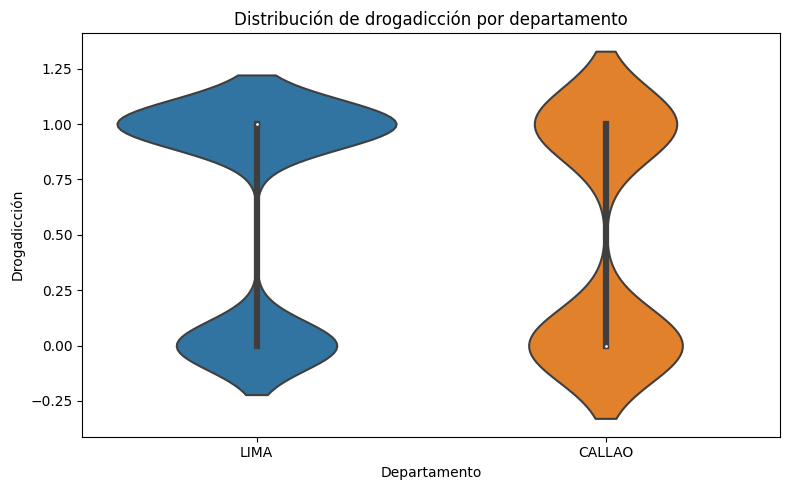

In [12]:
plt.figure(figsize=(8, 5))
sns.violinplot(x='DEPARTAMENTO', y='DROGADICCION_KPI', data=crimpob_lc)
plt.title('Distribución de drogadicción por departamento')
plt.xlabel('Departamento')
plt.ylabel('Drogadicción')
plt.tight_layout()
plt.show()

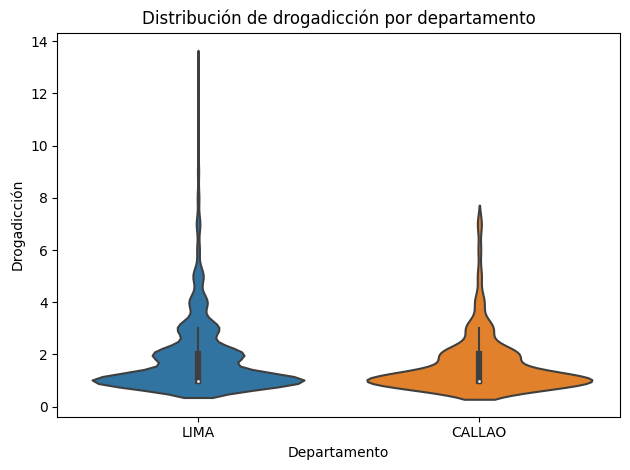

In [13]:
sns.violinplot(x='DEPARTAMENTO', y='NUMERO_DE_INGRESOS', data=crimpob_lc)
plt.title('Distribución de drogadicción por departamento')
plt.xlabel('Departamento')
plt.ylabel('Drogadicción')
plt.tight_layout()
plt.show()

<Axes: >

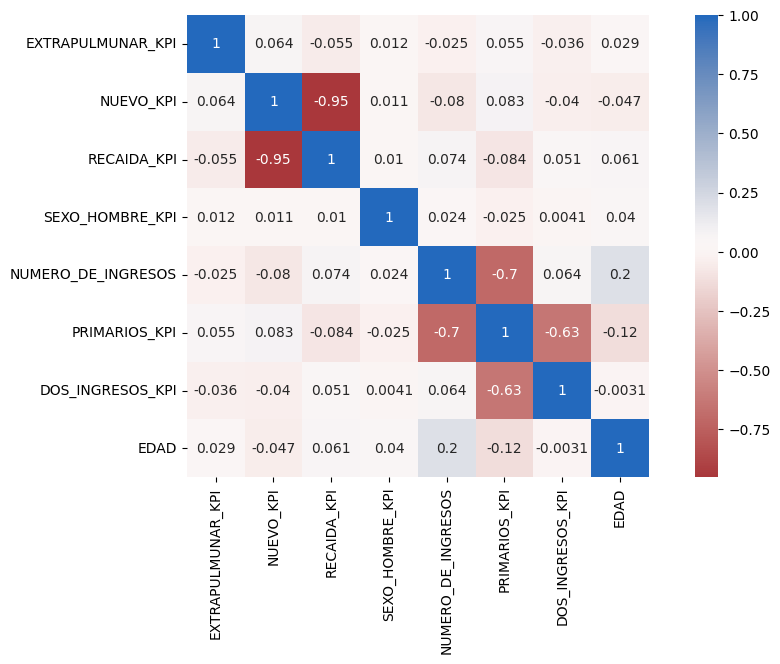

In [14]:
matriz = crimpob_lc[['EXTRAPULMUNAR_KPI', 'NUEVO_KPI', 'RECAIDA_KPI', 'TIENE_ANTECEDENTE_DE_VIH_PREVIO_A_LA_TB', 'RECIBIO_CONSEJERIA_PRE_TEST_PARA_VIH', 'SE_REALIZO_PRUEBA_DE_VIH', 'RESULTADO_DE_LA_PRUEBA_DE_VIH', 'DIAGNOSTICO_DE_DIABETES_POR_PRUEBA_DE_GLICEMIA', 'DELITO_ESPECIFICO', 'SEXO_HOMBRE_KPI', 'NUMERO_DE_INGRESOS', 'GRUPOS_DE_INGRESOS', 'PRIMARIOS_KPI', 'DOS_INGRESOS_KPI', 'EDAD', 'GRUPO_ETAREO']].corr()

plt.figure(figsize=(12,6))
sns.heatmap(matriz,
           cmap='vlag_r',
            square=True,
            annot=True
           )

<Axes: xlabel='PRIMARIOS_KPI', ylabel='DOS_INGRESOS_KPI'>

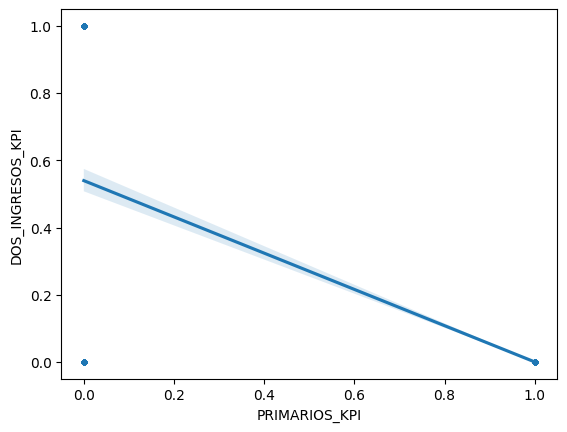

In [15]:
sns.regplot(data=crimpob_lc,
           x='PRIMARIOS_KPI',
            y='DOS_INGRESOS_KPI',
            scatter_kws={'s':10}
           )

<Axes: xlabel='RECAIDA_KPI', ylabel='NUEVO_KPI'>

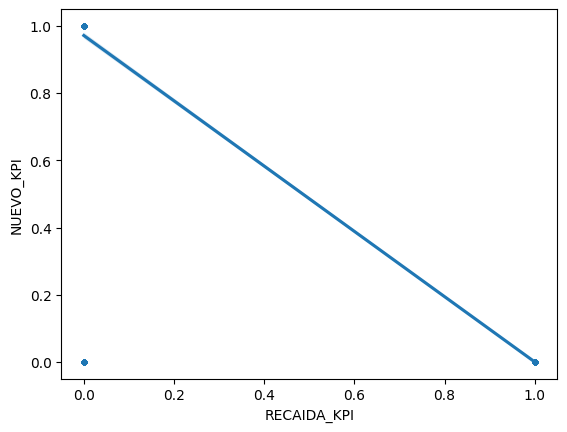

In [16]:
sns.regplot(data=crimpob_lc,
           x='RECAIDA_KPI',
            y='NUEVO_KPI',
            scatter_kws={'s':10}
           )

###2.3.- Geo Analysis

In [17]:
data = open('lima_callao_distritos.geojson',
           encoding='utf8'
           )
distritos = json.load(data)

In [18]:
print(type(distritos))

<class 'dict'>


In [19]:
distritos.keys()

dict_keys(['type', 'features'])

In [20]:
distritos['features'][10]['properties']

{'id': 41,
 'departamento': 'LIMA',
 'provincia': 'LIMA',
 'distrito': 'LOS OLIVOS',
 'institucion': 'IGN',
 'distrito2': None}

In [21]:
id = []
distrito = []

for idx in range(len(distritos['features'])):
    id.append(distritos['features'][idx]['properties']['id'])
    distrito.append(distritos['features'][idx]['properties']['distrito'])

In [22]:
geojson_df = pd.DataFrame({
    'id':id,
    'distrito':distrito
})

In [23]:
geojson_df

,id,distrito
0,2,SAN BORJA
1,6,JESUS MARIA
2,7,PACHACAMAC
3,10,SAN LUIS
4,12,LA MOLINA
5,13,ANCON
6,17,VILLA EL SALVADOR
7,32,SANTIAGO DE SURCO
8,38,ATE
9,39,CALLAO


In [24]:
geojson_df['color']=10

In [25]:
fig = px.choropleth_mapbox(geojson_df,
                           geojson=distritos,
                           locations='id',
                           featureidkey='properties.id',
                           color='color',
                           mapbox_style='carto-positron',
                           zoom=8,
                           center={'lat':-12.041377,
                                   'lon': -77.039402},
                           opacity=0.4,
                           hover_data=['distrito']
)

crim = px.scatter_mapbox(crimpob_lc,
                            lat='LATITUD',
                            lon='LONGITUD',
                            hover_name='DISTRITO',
                            color_discrete_sequence=["red"]
)

fig.add_trace(crim.data[0])

In [26]:
fig = px.scatter_mapbox(crimpob_lc,
                        lat='LATITUD',
                        lon='LONGITUD',
                        mapbox_style='carto-positron',
                        zoom=10, #ciudad
                        hover_name='DISTRITO',
                        color='DELITO_GENERICO',
                        size='NUMERO_DE_INGRESOS',
                        size_max=20 #limita el tamaño del punto
                        )
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0}) #elimina el marco
fig.show()

In [27]:
import plotly.express as px

fig = px.density_mapbox(crimpob_lc,
                        lat='LATITUD',
                        lon='LONGITUD',
                        mapbox_style='stamen-terrain',
                        color_continuous_scale='inferno',
                        zoom=10,
                        z='EDAD',  # Utiliza GRUPOS_DE_INGRESOS como la variable de intensidad
                        radius=5,
                        opacity=1,
                        center={
                            'lat': -12.055710,
                            'lon': -77.032658
                        })
fig.update_layout(
    margin={'r': 0, 't': 0, 'b': 0, 'l': 0}
)
fig.show()

In [28]:
crimpob_h3 = crimpob_lc.copy()

In [29]:
RES = 8
crimpob_h3['h3'] = crimpob_h3.apply(lambda x: h3.geo_to_h3(x.LATITUD, x.LONGITUD, RES), axis=1)

In [30]:
crimpob_h3.head()

,OFICINA_REGIONAL,ESTABLECIMIENTO_PENITENCIARIO,DEPARTAMENTO,PROVINCIA,DISTRITO,LATITUD,LONGITUD,NUCLEO_URBANO,TIPO_NUCLEO,LOCALIZACION_TB,...,SEXO_MUJER_KPI,NUMERO_DE_INGRESOS,GRUPOS_DE_INGRESOS,PRIMARIOS_KPI,DOS_INGRESOS_KPI,TRES_INGRESOS_KPI,EDAD,RANGO_DE_EDAD,GRUPO_ETAREO,h3
ID,,,,,,,,,,,,,,,,,,,,,
1,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE MIRAFLORES,-12.162536,-76.959604,AA.HH. ANTONIO DE PADUA,ASENTAMIENTO HUMANO,PULMONAR,...,0,1,Ingresa al penal por primera vez,1,0,0,24,18 - 24,18 - 29,888e62c5c1fffff
5,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.979465,-76.989448,AA.HH. EL PARAISO HUÁSCAR,ASENTAMIENTO HUMANO,PULMONAR,...,0,1,Ingresa al penal por primera vez,1,0,0,22,18 - 24,18 - 29,888e62d53dfffff
7,LIMA - LIMA,CHINCHA,LIMA,LIMA,SAN JUAN DE LURIGANCHO,-11.939513,-76.977647,AA.HH. MOTUPE,ASENTAMIENTO HUMANO,PULMONAR,...,0,1,Ingresa al penal por primera vez,1,0,0,20,18 - 24,18 - 29,888e62d541fffff
8,LIMA - LIMA,CHINCHA,LIMA,LIMA,VILLA MARIA DEL TRIUNFO,-12.142340,-76.941695,AA.HH. VALLECITO ALTO,ASENTAMIENTO HUMANO,PULMONAR,...,0,1,Ingresa al penal por primera vez,1,0,0,28,25 - 29,18 - 29,888e62c43dfffff
9,LIMA - LIMA,CHINCHA,LIMA,LIMA,VILLA MARIA DEL TRIUNFO,-12.157749,-76.947567,AA.HH. ARENAL ALTO,ASENTAMIENTO HUMANO,PULMONAR,...,0,1,Ingresa al penal por primera vez,1,0,0,25,25 - 29,18 - 29,888e62c5cbfffff


In [31]:
import pydeck as pdk

layer = pdk.Layer(
    "H3HexagonLayer",  # Design
    crimpob_h3,
    pickable=True,  # Selectable
    stroked=True,  # Show hexagon area boundaries
    filled=True,  # Fill hexagons with color
    extruded=False,
    get_hexagon="h3",
    get_fill_color="[255, 255, 100, 50]",
    get_line_color=[255, 255, 255],
    line_width_min_pixels=2,
)

view_state = pdk.ViewState(
    latitude=-12.041377,
    longitude=-77.039402,
    zoom=10,
    bearing=0,
    pitch=30  # Pitch or tilt of the map
)

deck = pdk.Deck(
    layers=[layer],
    initial_view_state=view_state,
    tooltip={"text": "fake text"}
)

# Render the visualization and save as an HTML file
deck.to_html("h3_hexagon_layer.html")

<IPython.core.display.Javascript object>

##3.- Data Preprocessing


In [32]:
drop_columns = ['PULMONAR_KPI', 'LOCALIZACION_TB', 'CONDICION_INGRESO', 'ABANDONO_RECUPERADO_KPI','ALCOHOLISMO', 'TABAQUISMO', 'DROGADICCION', 'SEXO', 'SEXO_MUJER_KPI', 'TRES_INGRESOS_KPI', 'RECIBE_TARGA', 'TIPO_DE_SEGURO_DE_SALUD', 'ALCOHOLISMO_KPI', 'TABAQUISMO_KPI', 'DROGADICCION_KPI', 'DELITO_GENERICO', 'SITUACION_JURIDICA', 'GRADO_DE_INSTRUCCION', 'OCUPACION_GENERICA', 'OCUPACION_ESPECIFICA', 'ESTADO_CIVIL', 'RANGO_DE_EDAD']
for column in drop_columns:
    crimpob_lc.drop(column, axis=1, inplace=True)
crimpob_lc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1818 entries, 1 to 3099
Data columns (total 26 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   OFICINA_REGIONAL                                1818 non-null   object 
 1   ESTABLECIMIENTO_PENITENCIARIO                   1818 non-null   object 
 2   DEPARTAMENTO                                    1818 non-null   object 
 3   PROVINCIA                                       1818 non-null   object 
 4   DISTRITO                                        1818 non-null   object 
 5   LATITUD                                         1818 non-null   float64
 6   LONGITUD                                        1818 non-null   float64
 7   NUCLEO_URBANO                                   1817 non-null   object 
 8   TIPO_NUCLEO                                     1818 non-null   object 
 9   EXTRAPULMUNAR_KPI                        

## 4.- Machine Learning Spatial: DBSCAN

In [33]:
KM_EPSILON = 0.5
MIN_SAMPLES = 6

In [34]:
def get_centermostpoint(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    centermost_point = min(cluster, key=lambda point: great_circle(point,centroid).m)
    return tuple(centermost_point)

In [35]:
print('Dataset Original', len(crimpob_lc))

crimpob_lc_clean = crimpob_h3[~crimpob_h3['LATITUD'].isna()]
print('Dataset limpio', len(crimpob_lc_clean))

coords_cluster = crimpob_lc_clean[['LATITUD', 'LONGITUD']].to_numpy()
coords_cluster #coordenadas de las que queremos tener sus clusters

Dataset Original 1818
Dataset limpio 1818


array([[-12.162536, -76.959604],
       [-11.979465, -76.989448],
       [-11.939513, -76.977647],
       ...,
       [-12.018289, -77.136494],
       [-12.0551  , -77.1222  ],
       [-12.0657  , -77.151   ]])

In [36]:
kms_per_radian = 6371.0088
epsilon = KM_EPSILON / kms_per_radian

db = DBSCAN(eps=epsilon,
           min_samples=MIN_SAMPLES,
            algorithm='ball_tree',
            metric='haversine'
           ).fit(np.radians(coords_cluster))

In [37]:
cluster_labels = db.labels_
cluster_labels

array([-1,  0,  1, ..., 39, -1, -1])

In [38]:
#creating clusters
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords_cluster[cluster_labels == n] for n in range(num_clusters)]).iloc[:-1]
print('Numero de clusters: {}'.format(num_clusters))

Numero de clusters: 63


In [39]:
#Obtenemos el centro de nuestros clusters
centermost_points = clusters.map(get_centermostpoint)

In [40]:
#creamos un dataframe con los clusters encontrados
lats, lons = zip(*centermost_points)
rep_points = pd.DataFrame({'lat':lats, 'lon':lons})
rep_points['size'] = 5
rep_points

,lat,lon,size
0,-11.962601,-77.000334,5
1,-11.938975,-76.973589,5
2,-12.189930,-76.952180,5
3,-12.045137,-76.984055,5
4,-11.853607,-77.123783,5
...,...,...,...
57,-11.955769,-77.051709,5
58,-11.951565,-77.078041,5
59,-11.825730,-77.133160,5
60,-12.071498,-77.121705,5


In [41]:
fig = px.choropleth_mapbox(geojson_df,
                           geojson=distritos,
                           locations='id',
                           featureidkey='properties.id',
                           color='color',
                           mapbox_style='carto-positron',
                           zoom=8,
                           center={'lat':-12.041377,
                                   'lon': -77.039402},
                           opacity=0.4,
                           hover_data=['distrito']
                          )

incidentes_cluster = px.scatter_mapbox(rep_points,
                                      lat="lat",
                                       lon="lon",
                                       hover_name="size",
                                       hover_data=["size"],
                                       mapbox_style="carto-positron",
                                       zoom=10,
                                       center={
                                           'lat':-12.036891,
                                           'lon':-77.026508
                                       },
                                       opacity=0.6,
                                       color_discrete_sequence=['red']
                                      )

fig.add_trace(incidentes_cluster.data[0])

In [42]:
# Crear un DataFrame con los centroides de los clusters
lats, lons = zip(*centermost_points)
rep_points = pd.DataFrame({'lat': lats, 'lon': lons})

# Reducción de dimensionalidad con t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(rep_points[['lat', 'lon']])

# Crear un DataFrame con los resultados de t-SNE
tsne_df = pd.DataFrame(tsne_result,
                       columns=['tsne_1',
                                'tsne_2'])
rep_points = pd.concat([rep_points,
                        tsne_df], axis=1)

# Visualización con t-SNE
fig_tsne = px.scatter(rep_points,
                      x='tsne_1',
                      y='tsne_2',
                      labels={'tsne_1': 't-SNE Dimension 1', 'tsne_2': 't-SNE Dimension 2'},
                      title='Visualización t-SNE de Resultados de Clustering')

fig_tsne.show()